# Classifying multi-label comments with Logistic Regression
#### Rhodium Beng
Started on 20 December 2017

This kernel is inspired by:
- kernel by Jeremy Howard : _NB-SVM strong linear baseline + EDA (0.052 lb)_
- kernel by Issac : _logistic regression (0.055 lb)_
- _Solving Multi-Label Classification problems_, https://www.analyticsvidhya.com/blog/2017/08/introduction-to-multi-label-classification/

In [1]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
%matplotlib inline
import seaborn as sns
import re

## Load training and test data

In [121]:
train_df = pd.read_csv('data/train.csv')
test_df = pd.read_csv('data/test.csv')

## Examine the data (EDA)

In [122]:
train_df.sample(5)

,id,comment_text,toxic,severe_toxic,obscene,threat,insult,identity_hate
97578,0a00389201957857,"You can redact all you want newseventsguy, the...",0,0,0,0,0,0
20749,36c9ecc4c824812f,"""Thank you for experimenting with the page Bul...",0,0,0,0,0,0
139099,e8620d3cd8fb4ba7,"I am removing AnjaliGupta's edits, which consi...",0,0,0,0,0,0
95092,fe3969da34cd7d6e,Wikipedia:Articles for deletion/The Game Tour ...,0,0,0,0,0,0
7482,13e0bc64da4a7a6b,With the above in mind I think we should resto...,0,0,0,0,0,0


In the training data, the comments are labelled as one or more of the six categories; toxic, severe toxic, obscene, threat, insult and identity hate. This is essentially a multi-label classification problem.

In [123]:
cols_target = ['obscene','insult','toxic','severe_toxic','identity_hate','threat']

In [124]:
# check missing values in numeric columns
train_df.describe()

,toxic,severe_toxic,obscene,threat,insult,identity_hate
count,159571.000000,159571.000000,159571.000000,159571.000000,159571.000000,159571.000000
mean,0.095844,0.009996,0.052948,0.002996,0.049364,0.008805
std,0.294379,0.099477,0.223931,0.054650,0.216627,0.093420
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


There are no missing numeric values. 
As the mean values are very small (some way below 0.05), there would be many not labelled as positive in the six categories. From this I guess that there would be many comments which are not labelled in any of the six categories. Let's take a look.

In [125]:
unlabelled_in_all = train_df[(train_df['toxic']!=1) & (train_df['severe_toxic']!=1) & (train_df['obscene']!=1) & 
                            (train_df['threat']!=1) & (train_df['insult']!=1) & (train_df['identity_hate']!=1)]
print('Percentage of unlabelled comments is ', len(unlabelled_in_all)/len(train_df)*100)

('Percentage of unlabelled comments is ', 0)


In [126]:
# check for any 'null' comment
no_comment = train_df[train_df['comment_text'].isnull()]
len(no_comment)

0

In [127]:
test_df.head()

,id,comment_text
0,00001cee341fdb12,Yo bitch Ja Rule is more succesful then you'll...
1,0000247867823ef7,== From RfC == \n\n The title is fine as it is...
2,00013b17ad220c46,""" \n\n == Sources == \n\n * Zawe Ashton on Lap..."
3,00017563c3f7919a,":If you have a look back at the source, the in..."
4,00017695ad8997eb,I don't anonymously edit articles at all.


In [128]:
no_comment = test_df[test_df['comment_text'].isnull()]
no_comment

,id,comment_text


All rows in the training and test data contain comments, so there's no need to clean up null fields.

In [129]:
# let's see the total rows in train, test data and the numbers for the various categories
print('Total rows in test is {}'.format(len(test_df)))
print('Total rows in train is {}'.format(len(train_df)))
print(train_df[cols_target].sum())

Total rows in test is 153164
Total rows in train is 159571
obscene           8449
insult            7877
toxic            15294
severe_toxic      1595
identity_hate     1405
threat             478
dtype: int64


As mentioned earlier, majority of the comments in the training data are not labelled in one or more of these categories.

In [130]:
# Let's look at the character length for the rows in the training data and record these
train_df['char_length'] = train_df['comment_text'].apply(lambda x: len(str(x)))

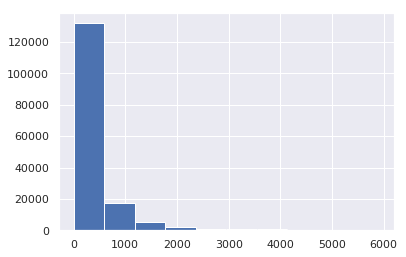

In [131]:
# look at the histogram plot for text length
sns.set()
train_df['char_length'].hist()
plt.show()

Most of the text length are within 500 characters, with some up to 5,000 characters long.

Next, let's examine the correlations among the target variables.

In [132]:
data = train_df[cols_target]

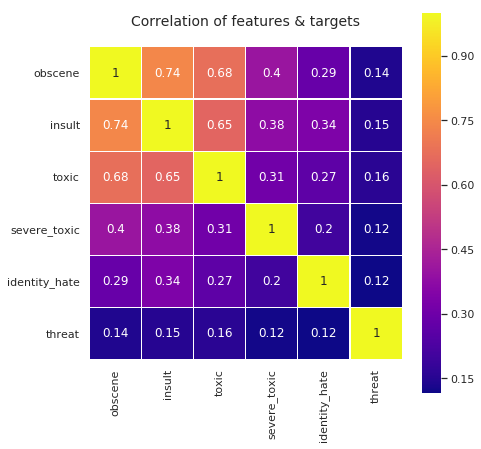

In [133]:
colormap = plt.cm.plasma
plt.figure(figsize=(7,7))
plt.title('Correlation of features & targets',y=1.05,size=14)
sns.heatmap(data.astype(float).corr(),linewidths=0.1,vmax=1.0,square=True,cmap=colormap,
           linecolor='white',annot=True)

In [134]:
xx = train_df[(train_df['toxic']==1) & (train_df['obscene']==1)].head(5)
print xx
print list(xx['id'])
print list(xx['comment_text'])

                  id                                       comment_text  \
6   0002bcb3da6cb337       COCKSUCKER BEFORE YOU PISS AROUND ON MY WORK   
42  001810bf8c45bf5f  You are gay or antisemmitian? \n\nArchangel WH...   
43  00190820581d90ce           FUCK YOUR FILTHY MOTHER IN THE ASS, DRY!   
51  001dc38a83d420cf  GET FUCKED UP. GET FUCKEEED UP.  GOT A DRINK T...   
55  0020e7119b96eeeb  Stupid peace of shit stop deleting my stuff as...   

    toxic  severe_toxic  obscene  threat  insult  identity_hate  char_length  
6       1             1        1       0       1              0           44  
42      1             0        1       0       1              1          648  
43      1             0        1       0       1              0           40  
51      1             0        1       0       0              0          124  
55      1             1        1       0       1              0           89  
['0002bcb3da6cb337', '001810bf8c45bf5f', '00190820581d90ce', '001dc38a83d42

Indeed, it looks like some of the labels are higher correlated, e.g. insult-obscene has the highest at 0.74, followed by toxic-obscene and toxic-insult.

What about the character length & distribution of the comment text in the test data?

In [135]:
test_df['char_length'] = test_df['comment_text'].apply(lambda x: len(str(x)))

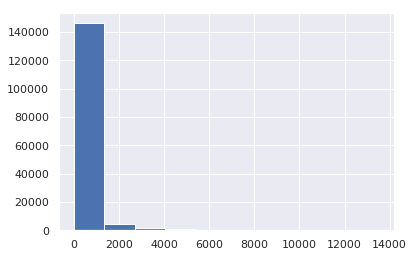

In [136]:
plt.figure()
plt.hist(test_df['char_length'])
plt.show()

Now, the shape of character length distribution looks similar between the training data and the train data. For the training data, I guess the train data were clipped to 5,000 characters to facilitate the folks who did the labelling of the comment categories.

## Clean up the comment text

In [137]:
def clean_text(text):
    text = text.lower()
    text = re.sub(r"what's", "what is ", text)
    text = re.sub(r"\'s", " ", text)
    text = re.sub(r"\'ve", " have ", text)
    text = re.sub(r"can't", "cannot ", text)
    text = re.sub(r"n't", " not ", text)
    text = re.sub(r"i'm", "i am ", text)
    text = re.sub(r"\'re", " are ", text)
    text = re.sub(r"\'d", " would ", text)
    text = re.sub(r"\'ll", " will ", text)
    text = re.sub(r"\'scuse", " excuse ", text)
    text = re.sub('\W', ' ', text)
    text = re.sub('\s+', ' ', text)
    text = text.strip(' ')
    return text

In [138]:
# clean the comment_text in train_df [Thanks to Pulkit Jha for the useful pointer.]
train_df['comment_text'] = train_df['comment_text'].map(lambda com : clean_text(com))

In [139]:
# clean the comment_text in test_df [Thanks, Pulkit Jha.]
test_df['comment_text'] = test_df['comment_text'].map(lambda com : clean_text(com))


## Define X from entire train & test data for use in tokenization by Vectorizer

In [140]:
train_df = train_df.drop('char_length',axis=1)

In [141]:
X = train_df.comment_text
test_X = test_df.comment_text

In [142]:
print(X.shape, test_X.shape)

((159571,), (153164,))


In [145]:
X[0]

'explanation why the edits made under my username hardcore metallica fan were reverted they were not vandalisms just closure on some gas after i voted at new york dolls fac and please do not remove the template from the talk page since i am retired now 89 205 38 27'

In [144]:
type(X),type(test_X)

(pandas.core.series.Series, pandas.core.series.Series)

## Vectorize the data

In [146]:
# import and instantiate TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
vect = TfidfVectorizer(max_features=5000,stop_words='english')
vect

TfidfVectorizer(analyzer=u'word', binary=False, decode_error=u'strict',
        dtype=<type 'numpy.int64'>, encoding=u'utf-8', input=u'content',
        lowercase=True, max_df=1.0, max_features=5000, min_df=1,
        ngram_range=(1, 1), norm=u'l2', preprocessor=None, smooth_idf=True,
        stop_words='english', strip_accents=None, sublinear_tf=False,
        token_pattern=u'(?u)\\b\\w\\w+\\b', tokenizer=None, use_idf=True,
        vocabulary=None)

In [147]:
# learn the vocabulary in the training data, then use it to create a document-term matrix
X_dtm = vect.fit_transform(X)
# examine the document-term matrix created from X_train
X_dtm

<159571x5000 sparse matrix of type '<type 'numpy.float64'>'
	with 3179238 stored elements in Compressed Sparse Row format>

In [148]:
# transform the test data using the earlier fitted vocabulary, into a document-term matrix
test_X_dtm = vect.transform(test_X)
# examine the document-term matrix from X_test
test_X_dtm

<153164x5000 sparse matrix of type '<type 'numpy.float64'>'
	with 2620802 stored elements in Compressed Sparse Row format>

## Solving a multi-label classification problem
One way to approach a multi-label classification problem is to transform the problem into separate single-class classifier problems. This is known as 'problem transformation'. There are three methods:
* _**Binary Relevance.**_ This is probably the simplest which treats each label as a separate single classification problems. The key assumption here though, is that there are no correlation among the various labels.
* _**Classifier Chains.**_ In this method, the first classifier is trained on the input X. Then the subsequent classifiers are trained on the input X and all previous classifiers' predictions in the chain. This method attempts to draw the signals from the correlation among preceding target variables.
* _**Label Powerset.**_ This method transforms the problem into a multi-class problem  where the multi-class labels are essentially all the unique label combinations. In our case here, where there are six labels, Label Powerset would in effect turn this into a 2^6 or 64-class problem. {Thanks Joshua for pointing out.}

## Binary Relevance - build a multi-label classifier using Logistic Regression

In [33]:
# import and instantiate the Logistic Regression model
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
logreg = LogisticRegression(C=12.0)

# create submission file
submission_binary = pd.read_csv('data/sample_submission.csv')
print submission_binary.head(5)

for label in cols_target:
    print('... Processing {}'.format(label))
    y = train_df[label]
    # train the model using X_dtm & y
    logreg.fit(X_dtm, y)
    # compute the training accuracy
    y_pred_X = logreg.predict(X_dtm)
    print('Training accuracy is {}'.format(accuracy_score(y, y_pred_X)))
    # compute the predicted probabilities for X_test_dtm
    test_y_prob = logreg.predict_proba(test_X_dtm)[:,1]
    print "test_y_prob : ",test_y_prob
    submission_binary[label] = test_y_prob
    print submission_binary.head(5)

                 id  toxic  severe_toxic  obscene  threat  insult  \
0  00001cee341fdb12    0.5           0.5      0.5     0.5     0.5   
1  0000247867823ef7    0.5           0.5      0.5     0.5     0.5   
2  00013b17ad220c46    0.5           0.5      0.5     0.5     0.5   
3  00017563c3f7919a    0.5           0.5      0.5     0.5     0.5   
4  00017695ad8997eb    0.5           0.5      0.5     0.5     0.5   

   identity_hate  
0            0.5  
1            0.5  
2            0.5  
3            0.5  
4            0.5  
... Processing obscene
Training accuracy is 0.983324037576
test_y_prob :  [9.99966669e-01 3.81966832e-04 3.12181581e-03 ... 5.52725076e-03
 1.05400016e-02 9.82265146e-01]
                 id  toxic  severe_toxic   obscene  threat  insult  \
0  00001cee341fdb12    0.5           0.5  0.999967     0.5     0.5   
1  0000247867823ef7    0.5           0.5  0.000382     0.5     0.5   
2  00013b17ad220c46    0.5           0.5  0.003122     0.5     0.5   
3  00017563c3f7919a 

In [29]:
test_X_dtm[0].data

array([0.1988895 , 0.12512252, 0.32307259, 0.20406974, 0.19438226,
       0.09701924, 0.12258119, 0.23838238, 0.15531468, 0.18000869,
       0.30972725, 0.11272455, 0.21755026, 0.16362197, 0.14168987,
       0.08289805, 0.22276362, 0.16192704, 0.21362465, 0.1474456 ,
       0.20726051, 0.19371041, 0.20439439, 0.34772095, 0.16467623])

In [30]:
# transform the test data using the earlier fitted vocabulary, into a document-term matrix
test_1 = vect.transform(['COCKSUCKER BEFORE YOU PISS AROUND ON MY WORK'])
# examine the document-term matrix from X_test
test_1

<1x5000 sparse matrix of type '<type 'numpy.float64'>'
	with 3 stored elements in Compressed Sparse Row format>

In [35]:
logreg.predict_proba(test_1)#[:,1]

array([[0.99789451, 0.00210549]])

In [157]:
#dir(logreg)

In [42]:
logreg.predict_proba(test_1)

array([[0.99789451, 0.00210549]])

### Create submission file

In [42]:
submission_binary.head()

,id,toxic,severe_toxic,obscene,threat,insult,identity_hate
0,00001cee341fdb12,0.999958,0.486934,0.999967,0.050054,0.971641,0.433414
1,0000247867823ef7,0.002297,0.000419,0.000382,0.000334,0.003240,0.000392
2,00013b17ad220c46,0.011018,0.000114,0.003122,0.000036,0.007348,0.001250
3,00017563c3f7919a,0.001254,0.002103,0.000925,0.000122,0.000833,0.000030
4,00017695ad8997eb,0.019273,0.000847,0.001260,0.000609,0.003234,0.000588


In [43]:
# generate submission file
submission_binary.to_csv('data/submission_binary.csv',index=False)

#### Binary Relevance with Logistic Regression classifier scored 0.074 on the public leaderboard.

## Classifier Chains - build a multi-label classifier using Logistic Regression

In [ ]:
# create submission file
submission_chains = pd.read_csv('data/sample_submission.csv')

# create a function to add features
def add_feature(X, feature_to_add):
    '''
    Returns sparse feature matrix with added feature.
    feature_to_add can also be a list of features.
    '''
    from scipy.sparse import csr_matrix, hstack
    return hstack([X, csr_matrix(feature_to_add).T], 'csr')

In [ ]:
for label in cols_target:
    print('... Processing {}'.format(label))
    y = train_df[label]
    # train the model using X_dtm & y
    logreg.fit(X_dtm,y)
    # compute the training accuracy
    y_pred_X = logreg.predict(X_dtm)
    print('Training Accuracy is {}'.format(accuracy_score(y,y_pred_X)))
    # make predictions from test_X
    test_y = logreg.predict(test_X_dtm)
    test_y_prob = logreg.predict_proba(test_X_dtm)[:,1]
    submission_chains[label] = test_y_prob
    # chain current label to X_dtm
    X_dtm = add_feature(X_dtm, y)
    print('Shape of X_dtm is now {}'.format(X_dtm.shape))
    # chain current label predictions to test_X_dtm
    test_X_dtm = add_feature(test_X_dtm, test_y)
    print('Shape of test_X_dtm is now {}'.format(test_X_dtm.shape))

### Create submission file

In [ ]:
submission_chains.head()

In [ ]:
# generate submission file
submission_chains.to_csv('data/submission_chains.csv', index=False)

## Create a combined submission

In [ ]:
# create submission file
submission_combined = pd.read_csv('data/sample_submission.csv')

Combine using simple average from Binary Relevance and Classifier Chains.

In [ ]:
# corr_targets = ['obscene','insult','toxic']
for label in cols_target:
    submission_combined[label] = 0.5*(submission_chains[label]+submission_binary[label])

In [ ]:
submission_combined.head()

In [ ]:
# generate submission file
submission_combined.to_csv('data/submission_combined.csv', index=False)

### Thanks for reading my kernel.
### Tips and comments are most welcomed & appreciated.
### Please upvote if you find it useful.

In [44]:
from sklearn import datasets
X, Y = datasets.make_multilabel_classification(n_samples=100,
                                                       n_features=20,
                                                       n_classes=5,
                                                       n_labels=3,
                                                       length=50,
                                                       allow_unlabeled=True,
                                                       random_state=0)

In [53]:
Y[:2]

array([[0, 0, 1, 1, 1],
       [1, 1, 0, 1, 0]])

In [56]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.25)

In [71]:
y_train[:5]
#tt = X_train[0]

array([[0, 1, 0, 1, 0],
       [0, 0, 0, 1, 0],
       [1, 0, 0, 0, 1],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0]])

In [62]:
# using binary relevance
from skmultilearn.problem_transform import BinaryRelevance
from sklearn.naive_bayes import GaussianNB

# initialize binary relevance multi-label classifier
# with a gaussian naive bayes base classifier
classifier = BinaryRelevance(GaussianNB())

# train
classifier.fit(X_train, y_train)

# predict
predictions = classifier.predict(X_test)

In [70]:
print classifier.predict(X_train[:1])
#X_test[:1]
#tt.reshape(-1,1)

  (0, 1)	1
  (0, 3)	1


In [156]:
#X.values
#data.values.tolist()
#data.head(8)

,obscene,insult,toxic,severe_toxic,identity_hate,threat
0,0,0,0,0,0,0
1,0,0,0,0,0,0
2,0,0,0,0,0,0
3,0,0,0,0,0,0
4,0,0,0,0,0,0
5,0,0,0,0,0,0
6,1,1,1,1,0,0
7,0,0,0,0,0,0


In [84]:
import numpy as np
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.svm import LinearSVC
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.multiclass import OneVsRestClassifier
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer
from sklearn.metrics import f1_score

In [164]:


X_train = np.array(["Hi","Hi what's up?","Hello","new york is a hell of a town",
                    "new york was originally dutch",
                    "the big apple is great",
                    "new york is also called the big apple",
                    "nyc is nice",
                    "people abbreviate new york city as nyc",
                    "the capital of great britain is london",
                    "london is in the uk",
                    "london is in england",
                    "london is in great britain",
                    "it rains a lot in london",
                    "london hosts the british museum",
                    "new york is great and so is london",
                    "i like london better than new york but britain is good",
                   "britain is in the uk",
                    "britain is in england",
                    "britain is in great britain",
                   "britain is a best known town",
                    "london was originally britain",
                    "the english is britain","Hi. london is in the uk","hello. nyc is nice",])
y_train_text = [["greet"],["greet"],["greet"],["new york"],["new york"],["new york"],["new york"],["new york"],
                ["new york"],["london"],["london"],["london"],["london"],
                ["london"],["london"],["new york","london"],["new york","london","britain"],
                ["britain"],["britain"],["britain"],["britain"],["britain"],
                ["britain"],["greet","london"],["greet","new york"]]

X_test = np.array(['nice day in nyc',
                   'welcome to london',
                   'london is rainy',
                   'is england a britain',
                   'it is raining in britain and the big apple',
                   'it is raining in britain and nyc',
                   'hello welcome to new york. enjoy it here and london too'
                  'hello there. have you been to london'])
target_names = ['New York', 'London']
y_test = []
'''

target_names = cols_target #target_names
X_train = X.values #X_train
y_train_text = data.values.tolist() #y_train_text
X_test = test_X.values #X_test
print target_names
print X_train[:5]
print y_train_text[:5]
print X_test[:5]
'''
mlb = MultiLabelBinarizer()
Y = mlb.fit_transform(y_train_text)
print mlb.classes_

#rf = RandomForestClassifier(n_estimators=500, criterion='gini',oob_score=True, class_weight='balanced',n_jobs=-1, verbose=1)

classifier = Pipeline([
    ('vectorizer', CountVectorizer()),
    ('tfidf', TfidfTransformer()),
    #('clf', OneVsRestClassifier(LinearSVC()))])
    ('clf', OneVsRestClassifier(LogisticRegression(solver='sag'), n_jobs=1))])
    #('clf', OneVsRestClassifier(MultinomialNB(fit_prior=True, class_prior=None)))])
    #('clf', OneVsRestClassifier(rf))])

classifier.fit(X_train, Y)
predicted = classifier.predict(X_test)
print predicted
print classifier.predict_proba(X_test)
all_labels = mlb.inverse_transform(predicted)

for item, labels in zip(X_test, all_labels):
    print('{0} => {1}'.format(item, ', '.join(labels)))

['britain' 'greet' 'london' 'new york']
[[0 0 0 0]
 [0 0 1 0]
 [0 0 1 0]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]
 [0 0 0 0]]
[[0.20364332 0.23436264 0.27121826 0.48383902]
 [0.19142837 0.17839389 0.62031102 0.2750964 ]
 [0.21721984 0.16204252 0.58699733 0.31126962]
 [0.44908989 0.13810142 0.29886236 0.25544004]
 [0.28380327 0.14466044 0.33958402 0.37107421]
 [0.30085879 0.16591802 0.354167   0.3554194 ]
 [0.16928049 0.21958049 0.47205214 0.43800452]]
nice day in nyc => 
welcome to london => london
london is rainy => london
is england a britain => 
it is raining in britain and the big apple => 
it is raining in britain and nyc => 
hello welcome to new york. enjoy it here and london toohello there. have you been to london => 


In [111]:
#parameters = {
#        "estimator__criterion": ['gini', 'entropy'],
#        "estimator__max_depth": [10, 15, 20, 25, None],
#        "estimator__max_features": ['auto', 'sqrt', 'log2', None]
#    }
parameters = {
    'penalty':['l1', 'l2', 'elasticnet'],        # l1 is Lasso, l2 is Ridge
    'solver':['liblinear'],
    'C': np.linspace(0.00002,1,100)
}
#ovr = OneVsRestClassifier(RandomForestClassifier(n_estimators=1000,oob_score=True, n_jobs=-1, verbose=1))
ovr = OneVsRestClassifier(LogisticRegression(solver='sag'), n_jobs=1)
model_tunning = GridSearchCV(ovr, param_grid={}, verbose=1,
                                n_jobs=-1, cv=10,
                                scoring=make_scorer(accuracy_score))
#model_tunning.fit(X, y)
X = np.array([[0, 4, 5], [0, 5, 0], [3, 3, 3], [4, 0, 6], [6, 0, 0],[0, 4, 5], [0, 5, 0], [3, 3, 3], [4, 0, 6], [6, 0, 0],[0, 4, 5], [0, 5, 0], [3, 3, 3], [4, 0, 6], [6, 0, 0]])
y = np.array([[0, 1, 1],[0, 1, 0],[1, 1, 1],[1, 0, 1],[1, 0, 0],[0, 1, 1],[0, 1, 0],[1, 1, 1],[1, 0, 1],[1, 0, 0],[0, 1, 1],[0, 1, 0],[1, 1, 1],[1, 0, 1],[1, 0, 0]])

mlb = MultiLabelBinarizer()
y = mlb.fit_transform(y)
print mlb.classes_
print "===",y
model_tunning.fit(X,y)#(X_train, Y)
test_score = model_tunning.best_score_
print 'The best test score: ', test_score
y_score = model_tunning.predict_proba(X)
print y_score
#multiclass_roc(y_score, 'grid_search_02')

predicted = model_tunning.predict(X[:1])
print "**",predicted
#print classifier.predict_proba(X_test)
all_labels = mlb.inverse_transform(predicted)

for item, labels in zip(X_test, all_labels):
    print('{0} => {1}'.format(item, ', '.join(labels)))

[0 1]
=== [[1 1]
 [1 1]
 [0 1]
 [1 1]
 [1 1]
 [1 1]
 [1 1]
 [0 1]
 [1 1]
 [1 1]
 [1 1]
 [1 1]
 [0 1]
 [1 1]
 [1 1]]
Fitting 10 folds for each of 1 candidates, totalling 10 fits
The best test score:  0.8
[[0.79218488 1.        ]
 [0.78147946 1.        ]
 [0.69871425 1.        ]
 [0.83000366 1.        ]
 [0.7881551  1.        ]
 [0.79218488 1.        ]
 [0.78147946 1.        ]
 [0.69871425 1.        ]
 [0.83000366 1.        ]
 [0.7881551  1.        ]
 [0.79218488 1.        ]
 [0.78147946 1.        ]
 [0.69871425 1.        ]
 [0.83000366 1.        ]
 [0.7881551  1.        ]]
** [[1 1]]


[Parallel(n_jobs=-1)]: Done   6 out of  10 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    0.0s finished


TypeError: sequence item 0: expected string, numpy.int64 found

In [160]:
for item, labels in zip(X_test, all_labels):
    print('{0} => {1}'.format(item, ', '.join(str(labels))))

yo bitch ja rule is more succesful then you will ever be whats up with you and hating you sad mofuckas i should bitch slap ur pethedic white faces and get you to kiss my ass you guys sicken me ja rule is about pride in da music man dont diss that shit on him and nothin is wrong bein like tupac he was a brother too fuckin white boys get things right next time => (, 0, ,,  , 1, )
from rfc the title is fine as it is imo => (, 0, ,, )
sources zawe ashton on lapland => (, 0, ,, )
if you have a look back at the source the information i updated was the correct form i can only guess the source had not updated i shall update the information once again but thank you for your message => (, 0, ,, )
i do not anonymously edit articles at all => (, 0, ,, )
thank you for understanding i think very highly of you and would not revert without discussion => (, 0, ,, )
please do not add nonsense to wikipedia such edits are considered vandalism and quickly undone if you would like to experiment please use t

ok that good now => (, 0, ,, )
and technical terminology => (, 0, ,, )
ani hello andreas2009 there is a report involving your conduct at wp ani here you can go there to explain your edits thank you => (, 0, ,, )
sanity check a brief sanity check the name of the man charged with but exonerated of stealing cleckheaton station is easy to find in reliable sources but i assume it thought best not to name him as he is probably still alive is that right => (, 0, ,, )
of http www flickr com photos scribner 2303320873 which does not have a license compatible with wikipedia and there is no credible assertion that the image is public domain fair use or available under a free license => (, 0, ,, )
naw nigga nigga naw => (, 0, ,, )
why why is potassium dichromate used as a preservative for artifacts when it is highly corrosive => (, 0, ,, )
i removed the frog penis caption the real name is raumskulptur translates a spacial sculpture i will take a snap of the sign next time i am down on campus the p

i am sorry being too fast whith the speed statement never heard about the convair cv 800 sorry to say but i hope the photo is worth something reguarding my special handeling contribution some of the stated issues may very well apply to some other obsolete aircraft aswell especially the b 707 my rather deep knowlidge about boeing 720 is of course not that i have chosen boeing 720 as signature but that the captain on the photo is my dad especially after he became captain in 1976 i used do follow with him a couple of times evry year he was posted at ekch cph copenhagen kastrup airport and flew for the danish charter company conair or consolidated air of scandinavia usually to the mediterranian but also to london paris and salzburg until late autumn 1987 he flew boeing 720 b picture shows a boeing 720a though in the start he flew dc7 props and after the boeing 720 era airbus a300 and a320 but only the boeing 720 is a subject of high interest to me best reguards => (, 0, ,, )
quinine quinid

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



lol okay buddy stay in denial i do not care el machete guerrero => (, 0, ,, )
given that this is an election contested by individual candidates presidential style seems quite appropriate to me but if you think that the template needs modifying by all means propose that on the template talk page in the meantime we need an infobox which works in this article and the exact hidden title used to generate it is irrelevant => (, 0, ,, )
and what is better to sell horse paintings than women => (, 0, ,, )
if someone else had enough research to back it up not you because it would be original research then you could add a section about theories of life on other planets i think it a pretty common idea but i would have to check my references before i would post anything i seem to remember once hearing about such life forms on mars but i honestly do not remember just make sure you cite your sources and make it clear that this is all theoretical => (, 0, ,, )
look i understand that it is difficult fo

by the way we seem to be clogging up your talk page feel free to move to mine or perform some other technical hocus pocus if this is a problem => (, 0, ,, )
oh no worries then take care => (, 0, ,, )
saharia data is seriously messed up and this group does not show up in the supplementary mp tribe in the doc refers to mp gonds only => (, 0, ,, )
traditional counties sockpuppet investigation user owain an investigation is now underway at my request wikipedia requests_for_checkuser owain_ 28talk_ e2 80 a2_contribs 29 2c_monman_ 28talk_ e2 80 a2_contribs 29 other relevant material at wikipedia requests for investigation both at watchlist owain and at under investigation it is me that was first under investigation at the request of user owain please keep an eye on the progress of this any additional information you can supply would be highly valued but i really just want some calm heads to watch this situation i intend to also post this notice at the talk pages of some admins eg thanks => (

again until you actually do make a connection to iraq specifically to saddam connection to al qaeda this passage is simply not relevant here your point about the commission credibility belongs on the commission page where it already is not here => (, 0, ,, )
kohl kale thank you for your efforts to deepen readers semantic understanding of kale and its naming history what is unclear in your description i think is how members of the genus brassicaceae could include green leafy vegetables plants in the mustard family named in some continuity with cruciferous vegetables round cabbages and other plants such as cabbage cauliflower broccoli brussels sprouts some seeds etc the brassica article says crops from this genus are sometimes called cole cropsderived from the latin caulis meaning stem or cabbage => (, 0, ,, )
ok let admit that wikipedia can be incorrect however every japanese dragonball site said goku height is 175cm not even one exception you keep saying as if only you in the world has

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




ofthe crips of the century james pride is a hoe => (, 0, ,, )
this seems to be contrary to your suggestion in listing of isoxxx standards under development that standards under development should be listed => (, 0, ,, )
yes thank you for removing the image box i do not understand what the text of http en wikipedia org wiki wikipedia image_use_policy means i had verbal permission from the picture taker i did not have the language to convey this to wikipedia legal to meet the not understood http en wikipedia org wiki wikipedia image_use_policy would you be willing to assist me thanks => (, 0, ,, )
 => (, 0, ,, )
a high quality primary source with relevant quotations for clinical trials along with summary with secondary source support nicely done support its inclusion => (, 0, ,, )
what are you talking about my edit to juninho is perfectly fine it is not nonsense but merely how his name was spelled during an exhibition game in haifa check that shit out yadadadamean => (, 0, ,,  , 1, )
my

world of warcraft => (, 0, ,, )
ian well you too have come back here to continue this dialogue have you not the issue here is that i should be able to comment on the sentence in the article which is was glaringly wrong to anyone with an intermediate acquaintance with reiki without it becoming the long thread that it has become not because this served the article but because i was hit by a wall of bureaucracy and stonewalling that had nothing to do with improving the actual subject but was instead in the service of your ego no wonder so many people give up editing wikipedia it is you who wanted to win by arguing a ridiculous point in order to make yourself right and perceive another as wrong in your own mind an ego bolstering strategy i have got your back up because my comments have reflected your behaviour back to you so you have run off and made silly comments about my other contribution adrenal fatigue in order to vindicate yourself another ego bolstering strategy at the end of the d

if she commited suicide given no autopsy has yet been carried out yet how can they possible make such claims that she died of apparent suicide and handwritten suicide notes were found near the body regarding are liable sources i thought wikipedia wanted facts and not opinion so please report on the death of palfrey and say this tarpon springs police report finding the body of deborah jeane palfrey police sources also state that she hanged herself and notes found near the body were suicide notes left by the deceased see simple is not that the sum totality of what happened => (, 0, ,, )
he had sex with many ugly women wit large breast implants => (, 0, ,,  , 1, )
re hello again i really do not know enough about spelling reform to definitively evaluate the degree to which the article is biased toward one side or another wikipedia neutrality policy requires that all significant views be represented fairly and without bias where the significance of a view is determined by the presence or ab

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



disambiguation pages are you familar with wp mosdab => (, 0, ,, )
biased this is completely ridiculous wikipedia is supposed to be unbiased all i saw on that page was the bitter views of some disgruntled losers who most likly have no relation to actual native americans and if you do it probably means your ancestors raped an indian => (, 0, ,, )
my dog craped on the floor and it smelled like a fat woman sweating => (, 0, ,,  , 1, )
graduate farmers multi purpose cooperative society ltd c o avan panno global ltd 67 douglas rd owerri tel 08036642620 self help coordinator embassy of the usa plot 1075 diplomatic dr cbd abuja application for assistance in our self help piggery livestock project sir we are an all graduate farmers co operative society based in owerri imo state capital due to the endemic unemploment situation in nigeria we the above mentioned body had been working on a self help effort for some time and due to very limited resources at our disposal we are now incapable of meeti

why are you afraid of keeping my talk intact so that other can know who is ignorant about water margin in fact why not duel by words on the understanding of water margin let other wikipedians be the judge to see whose article is shit and who will be despised by others taunt and threat are not good ways for fight i am waiting for you giantcn => (, 0, ,, )
de gustibus non est disputandum fine so it your personal preference to have references hard to read but not wasting screen space wp notpaper ok so on articles you create or heavily edit you can do that and see if anyone objects what you can not do is roam around adding it where you feel like it and claim it ok per brd either start hearing that or hear a lot more about it => (, 0, ,, )
of course not nothing in science ever is => (, 0, ,, )
the reception section is fine i would much rather see an expansion of themes and other related topics => (, 0, ,, )
thank you for taking care of that and for the other cleanup you did i to the subordi

i agree the privacy stalking issue need careful handling but you said the info was already publically available my point on sourcing is simply to cite where it already publically available that is what alot of sourcing on wikipedia involoves anyway even in cases where something is very well known publically it is still useful to have a good source because they usually contain info not recorded here and hence are good for those seeking further info on a topic at least that is the way i read and it one reason wikipedia has internal links to other articles besides the simple fact that it possible however that still leaves the issue of notability not of the owners themselves but of the fact they own the aircraft i agree it is different than listing cessna owners by virtue of cost and numbers however the gblx is designed for use by vips and businesses so these ownerships usages are not really unique as again is travolta ownership of a 707 now if a celebrity lived on their gblx or otherwise 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




use fuck all you want just do not imply that i fuck up or could fuck up maninspace when we are discussing content together it distracting rude and off topic as for the rest i will let others comment since i have lost my taste for further discussion here => (, 0, ,,  , 1, )
i hope you do not mind i awarded you a barnstar for your hard work you are an asset to wikipedia => (, 0, ,, )
i do not think you can use this example to demonstrate the value of the derivative term the temperature of the water in the tub just cannot change that fast the example was previously about controlling the temperature of the water as it came out of the tap you could demonstrate a derivative as avioding scalding in that scenario => (, 0, ,, )
megahn rockx my soxs shes a cunt though => (, 0, ,,  , 1, )
crap view from melbourne clouds clouds and more bloody clouds => (, 0, ,,  , 1, )
no per montana => (, 0, ,, )
hi pedro although we are in general familiar with the principles and rules of wikipedia we did not 

we do not want zundel trash and white supremacists calling themselves german but maybe i give too much weight to a fringe phenomenon outbreak among uneducated idiots the classical adherents of such ideas => (, 0, ,, )
that is bullshit 30 000 buys a modest house in toronto in the 1960s => (, 0, ,, )
https en wikipedia org wiki educational_technology collaborative_learning collaborative learning please advice me sister daliya => (, 0, ,, )
mark666 i am adding a line just so you know this idiot is not me => (, 0, ,,  , 1, )
hi rusty thanks for your reply rather than rely on your and my memory which can be subject to human flaws such as error are you able to add a reference to back the comment up as per wikipedia guidlines that helps to try to ensure we are dealing in facts regards again => (, 0, ,, )
i came across this article while stub sorting selected links from a quick google search http intellit muskingum edu wwii_folder wwiieurope_folder wwiieurfinland html has relevant references h

In [161]:
test_df.head(5)

,id,comment_text,char_length
0,00001cee341fdb12,yo bitch ja rule is more succesful then you wi...,367
1,0000247867823ef7,from rfc the title is fine as it is imo,50
2,00013b17ad220c46,sources zawe ashton on lapland,56
3,00017563c3f7919a,if you have a look back at the source the info...,205
4,00017695ad8997eb,i do not anonymously edit articles at all,41


In [ ]:
cheche_test = test[test['id'].isin(['e3b8bc8940f2a818','bf20893fb08e02ce','2b4077833a3730bf','a83932247fc191ff','4a25b2ea6cf8f636','1429a2c930688317','9e1ae3198f36411c','b825a93b71af1972','3fa752bec4e7f1d8'])]
print cheche_test
X_cheche_test = cheche_test.comment_text